## 1.EDA

### 1) Import/Load

In [164]:
import os
import time
import random

import timm
import torch
import albumentations as A
import pandas as pd
import numpy as np
import torch.nn as nn
from albumentations.pytorch import ToTensorV2
from torch.optim import Adam
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score

In [165]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier  # Or any other classifier you're using
from sklearn.preprocessing import LabelEncoder
import cv2

In [166]:
# Load CSV files
train_data = pd.read_csv('/root/CV_PJT/CV_PJT/data/data/train.csv')
meta_data = pd.read_csv('/root/CV_PJT/CV_PJT/data/data/meta.csv')
sample_submission = pd.read_csv('/root/CV_PJT/CV_PJT/data/data/sample_submission.csv')

In [167]:
df = train_data.copy()

In [168]:
# 데이터 확인
print("Train Data:")
print(train_data.head())
print("\nMeta Data:")
print(meta_data.head())
print("\nSample Submission:")
print(sample_submission.head())


Train Data:
                     ID  target
0  002f99746285dfdd.jpg      16
1  008ccd231e1fea5d.jpg      10
2  008f5911bfda7695.jpg      10
3  009235e4c9c07af5.jpg       4
4  00b2f44967580c74.jpg      16

Meta Data:
   target                                         class_name
0       0                                     account_number
1       1  application_for_payment_of_pregnancy_medical_e...
2       2                                      car_dashboard
3       3            confirmation_of_admission_and_discharge
4       4                                          diagnosis

Sample Submission:
                     ID  target
0  0008fdb22ddce0ce.jpg       0
1  00091bffdffd83de.jpg       0
2  00396fbc1f6cc21d.jpg       0
3  00471f8038d9c4b6.jpg       0
4  00901f504008d884.jpg       0


### 2) 데이터 시각화 (클래스 분포/이미지 분포 등)

In [169]:
print("Columns in Train Data:")
print(train_data.columns)

Columns in Train Data:
Index(['ID', 'target'], dtype='object')


In [170]:
#Class별
train_data['target'].value_counts().sort_values(ascending=False)

target
16    100
10    100
6     100
4     100
5     100
15    100
9     100
7     100
11    100
2     100
8     100
12    100
3     100
0     100
13     74
14     50
1      46
Name: count, dtype: int64

/tmp/ipykernel_4790/2517582840.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=train_data, x='target', palette='husl')  # 'target'으로 변경


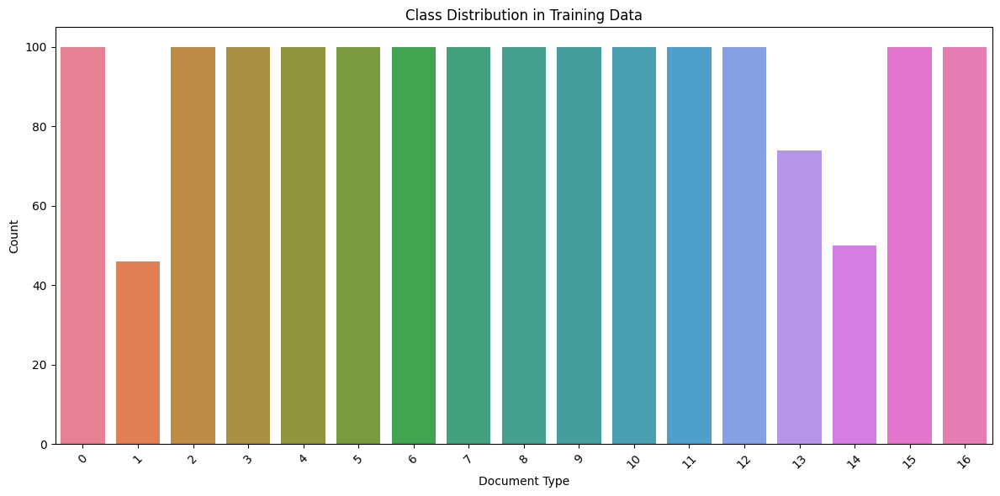

<Figure size 640x480 with 0 Axes>

In [180]:
# 클래스 분포 확인
plt.figure(figsize=(12, 6))
sns.countplot(data=train_data, x='target', palette='husl')  # 'target'으로 변경
plt.title('Class Distribution in Training Data')
plt.xlabel('Document Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()  # 그래프 요소가 겹치지 않도록 조정
plt.show()

##### => ★클래스 1, 13, 14 이미지 불균형 > 데이터 augmentation이나 샘플링


Train Data with Image Paths:
                     ID  target  \
0  002f99746285dfdd.jpg      16   
1  008ccd231e1fea5d.jpg      10   
2  008f5911bfda7695.jpg      10   
3  009235e4c9c07af5.jpg       4   
4  00b2f44967580c74.jpg      16   

                                          image_path  
0  /root/CV_PJT/CV_PJT/data/data/train/002f997462...  
1  /root/CV_PJT/CV_PJT/data/data/train/008ccd231e...  
2  /root/CV_PJT/CV_PJT/data/data/train/008f5911bf...  
3  /root/CV_PJT/CV_PJT/data/data/train/009235e4c9...  
4  /root/CV_PJT/CV_PJT/data/data/train/00b2f44967...  


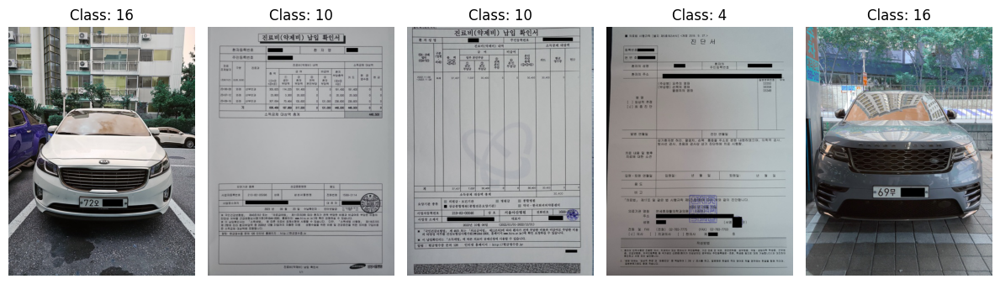

In [175]:
# 이미지가 저장된 디렉토리 경로
train_image_directory = '/root/CV_PJT/CV_PJT/data/data/train/'  # 훈련 이미지 폴더

# Construct image paths for training data
train_data['image_path'] = train_data['ID'].apply(lambda x: os.path.join(train_image_directory, f"{x}" if not x.endswith('.jpg') else x))

# Check the constructed paths
print("\nTrain Data with Image Paths:")
print(train_data.head())

# Display sample images from the dataset
plt.figure(figsize=(12, 6))
for index, row in train_data.head().iterrows():
    image_path = row['image_path']
    try:
        image = Image.open(image_path)
        plt.subplot(1, 5, index + 1)  # Adjust the number of subplots based on how many images you want to display
        plt.imshow(image)
        plt.title(f"Class: {row['target']}")
        plt.axis('off')  # Hide axis
    except FileNotFoundError as e:
        print(f"Error opening image {image_path}: {e}")

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

In [176]:
train_id_list = train_data['ID'].to_list()
train_size_dict = {'h':0, 'w':0}

for id in train_id_list:
    image_path = f'/root/CV_PJT/CV_PJT/data/data/train/{id}'  # 확장자 추가
    image = cv2.imread(image_path)
    
    if image is not None:
        h, w, c = image.shape
        train_size_dict['h'] = max(h, train_size_dict['h'])
        train_size_dict['w'] = max(w, train_size_dict['w'])  # 'h'를 'w'로 수정
    else:
        print(f"Failed to load image: {image_path}")

print(train_size_dict)

{'h': 682, 'w': 753}


In [177]:
test_id_list = sample_submission['ID'].to_list()

test_size_dict = {'h':0, 'w':0}
for id in test_id_list:
    image = cv2.imread(f'/root/CV_PJT/CV_PJT/data/data/test/{id}')
    h, w, c = image.shape
    test_size_dict['h'] = max(h, test_size_dict['h'])
    test_size_dict['w'] = max(h, test_size_dict['w'])

test_size_dict

KeyboardInterrupt: 

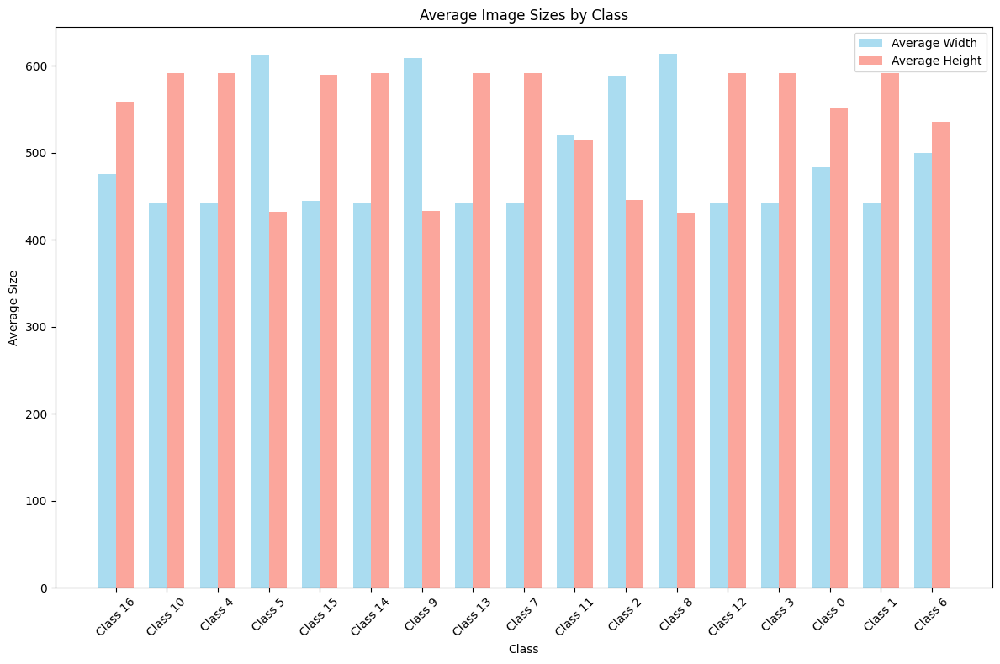

In [161]:
# Initialize dictionaries to store image sizes by class
class_image_sizes = {}

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Construct the image path
    image_path = os.path.join(image_path_prefix, row['ID'])
    
    # Open the image and get its dimensions
    image = Image.open(image_path)
    width, height = image.size
    
    # Retrieve the target class for the current image
    target = row['target']
    
    # Store the image sizes in the dictionary
    if target not in class_image_sizes:
        class_image_sizes[target] = []
    class_image_sizes[target].append((width, height))

# Calculate average sizes for each class
class_average_sizes = {}
for target, sizes in class_image_sizes.items():
    widths, heights = zip(*sizes)
    average_width = sum(widths) / len(widths)
    average_height = sum(heights) / len(heights)
    class_average_sizes[target] = (average_width, average_height)

# Prepare data for plotting
plt.figure(figsize=(12, 8))
class_labels = [f"Class {target}" for target in class_average_sizes.keys()]
average_widths = [size[0] for size in class_average_sizes.values()]
average_heights = [size[1] for size in class_average_sizes.values()]

# Set bar properties
bar_width = 0.35
index = range(len(class_labels))

# Define colors for the bars
width_color = 'skyblue'  # Color for average widths
height_color = 'salmon'   # Color for average heights

# Create bar plots for average widths and heights
plt.bar(index, average_widths, bar_width, color=width_color, alpha=0.7, label='Average Width')
plt.bar([i + bar_width for i in index], average_heights, bar_width, color=height_color, alpha=0.7, label='Average Height')

# Finalize the plot
plt.title('Average Image Sizes by Class')
plt.xlabel('Class')
plt.ylabel('Average Size')
plt.xticks([i + bar_width / 2 for i in index], class_labels, rotation=45)
plt.legend()
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

##### => ★전반적으로 큰 차이 없지만, 모든 이미지를 동일한 크기로 리사이즈하는 방법 고려

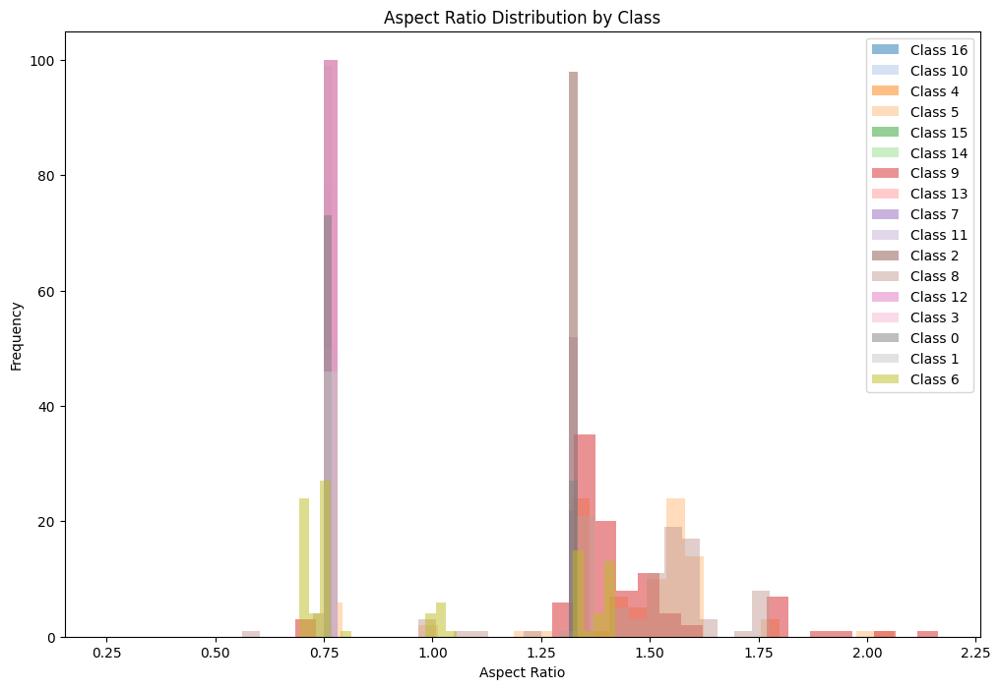

In [147]:
class_aspect_ratios = {}

# Assuming 'df' is already defined and contains the necessary data
for index, row in df.iterrows():
    image_path = os.path.join(image_path_prefix, row['ID'])
    image = Image.open(image_path)
    width, height = image.size
    aspect_ratio = width / height
    target = row['target']
    
    if target not in class_aspect_ratios:
        class_aspect_ratios[target] = []
    class_aspect_ratios[target].append(aspect_ratio)

plt.figure(figsize=(12, 8))

# Define a color palette with distinct colors for each class
colors = plt.cm.tab20.colors  # Use tab20 colormap which provides 20 distinct colors

for i, (target, aspect_ratios) in enumerate(class_aspect_ratios.items()):
    plt.hist(aspect_ratios, bins=30, alpha=0.5, color=colors[i % len(colors)], label=f'Class {target}')

plt.title('Aspect Ratio Distribution by Class')
plt.xlabel('Aspect Ratio')
plt.ylabel('Frequency')
plt.legend()
plt.show()

##### => ★ 대부분 클래스가 특정한 종횡비(0.75와 1.25 근처) 집중 > 문서 이미지 형태 주로 비슷한 비율 > 종횡비에 따라 리사이즈 방법 고려 cf) 2.00 클래스5,9 / 1.75 클래스5,9,8

#### 3) Pixel value(RGB 등)

In [ ]:
#df = train_data.copy()

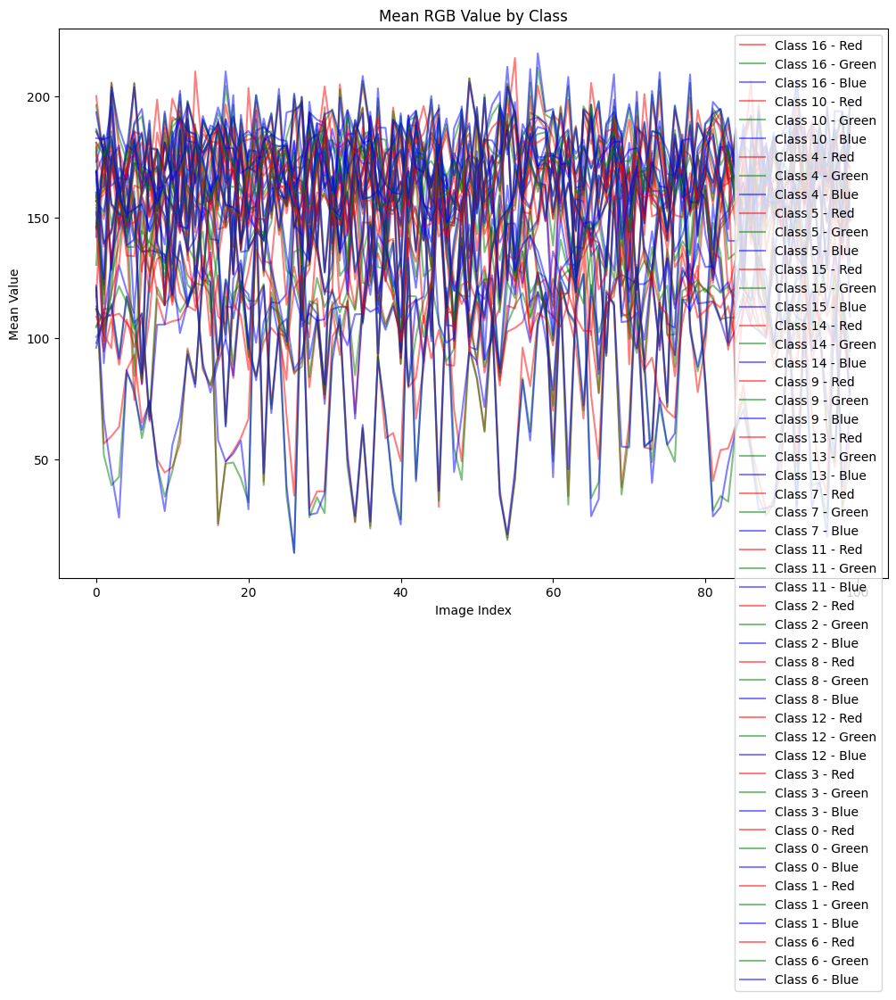

In [122]:
# Initialize dictionary to store RGB values by class
class_rgb_values = {}

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Construct the image path and open the image
    image_path = os.path.join(image_path_prefix, row['ID'])
    image = Image.open(image_path)
    rgb_array = np.array(image)
    
    # Get the target class for the current image
    target = row['target']
    
    # Store the RGB array in the dictionary
    if target not in class_rgb_values:
        class_rgb_values[target] = []
    class_rgb_values[target].append(rgb_array)

# Prepare for plotting
plt.figure(figsize=(12, 8))

# Plot mean RGB values for each class
for target, rgb_arrays in class_rgb_values.items():
    r_means = [np.mean(rgb[:, :, 0]) for rgb in rgb_arrays]
    g_means = [np.mean(rgb[:, :, 1]) for rgb in rgb_arrays]
    b_means = [np.mean(rgb[:, :, 2]) for rgb in rgb_arrays]
    
    plt.plot(r_means, label=f'Class {target} - Red', color='red', alpha=0.5)
    plt.plot(g_means, label=f'Class {target} - Green', color='green', alpha=0.5)
    plt.plot(b_means, label=f'Class {target} - Blue', color='blue', alpha=0.5)

# Finalize the plot
plt.title('Mean RGB Value by Class')
plt.xlabel('Image Index')
plt.ylabel('Mean Value')
plt.legend()
plt.show()

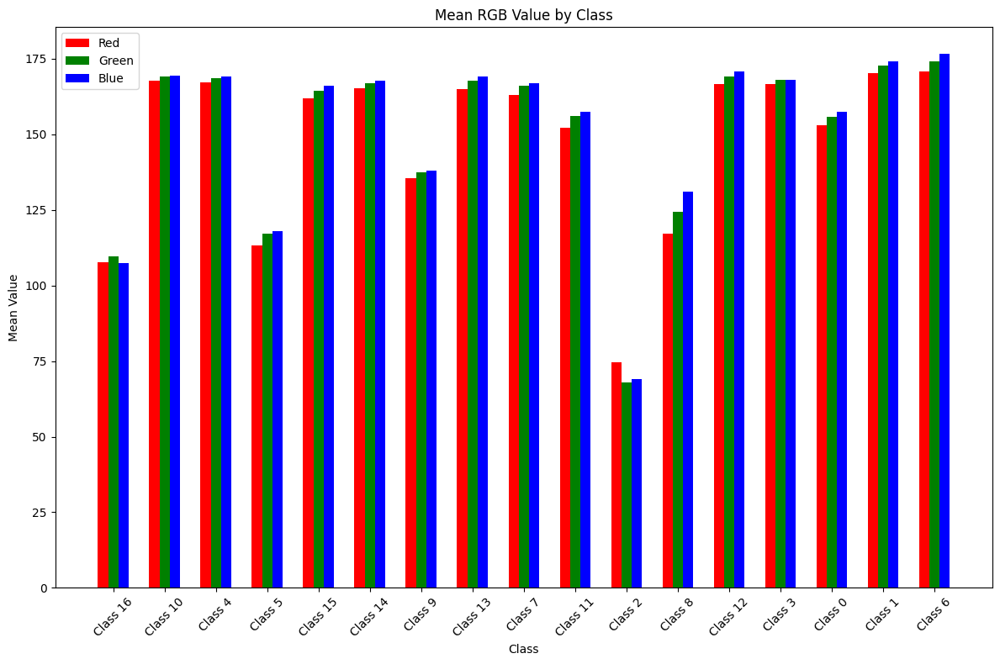

In [89]:
class_rgb_means = {}

for index, row in df.iterrows():
    image_path = os.path.join(image_path_prefix, row['ID'])
    image = Image.open(image_path)
    rgb_array = np.array(image)
    target = row['target']
    if target not in class_rgb_means:
        class_rgb_means[target] = []
    class_rgb_means[target].append(np.mean(rgb_array, axis=(0, 1)))

plt.figure(figsize=(12, 8))

class_labels = [f"Class {target}" for target in class_rgb_means.keys()]
r_means = [np.mean([rgb[0] for rgb in class_rgb_means[target]]) for target in class_rgb_means.keys()]
g_means = [np.mean([rgb[1] for rgb in class_rgb_means[target]]) for target in class_rgb_means.keys()]
b_means = [np.mean([rgb[2] for rgb in class_rgb_means[target]]) for target in class_rgb_means.keys()]

bar_width = 0.2
index = np.arange(len(class_labels))

plt.bar(index, r_means, bar_width, color='r', label='Red')
plt.bar(index + bar_width, g_means, bar_width, color='g', label='Green')
plt.bar(index + 2 * bar_width, b_means, bar_width, color='b', label='Blue')

plt.xlabel('Class')
plt.ylabel('Mean Value')
plt.title('Mean RGB Value by Class')
plt.xticks(index + bar_width, class_labels, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

#### => 평균 RGB 값은 비슷하므로 색상보다 명암, 밝기 등이 중요할 수 있음

##### ↓ ★★★아래 코드 클릭X (오래걸림)★★★

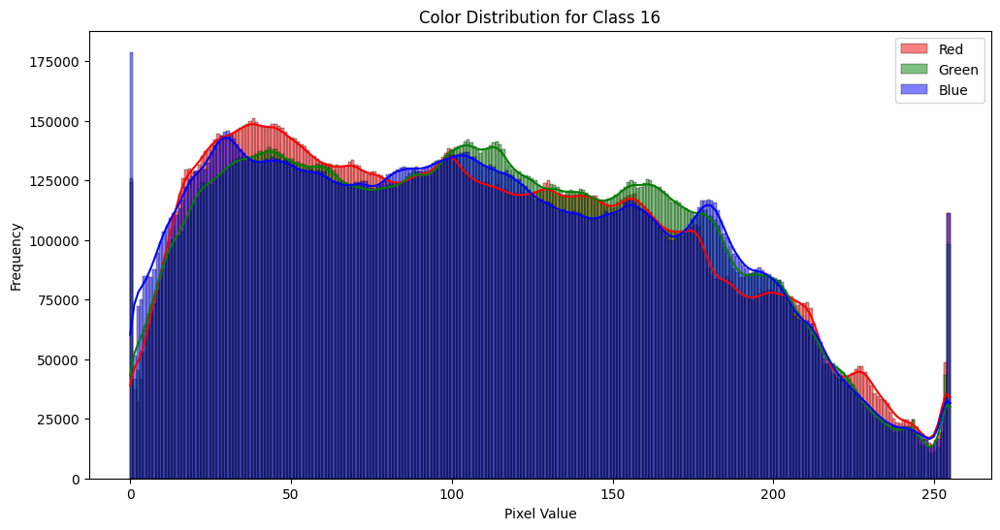

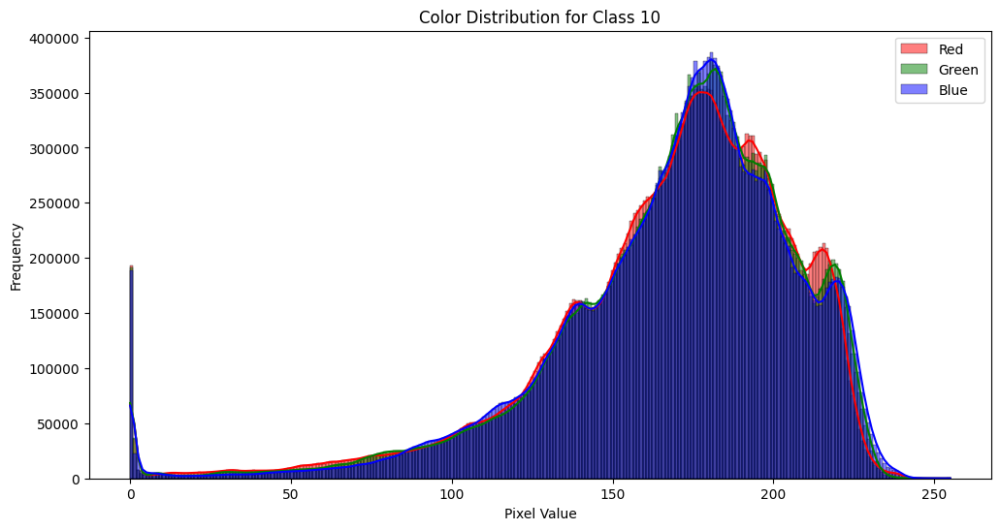

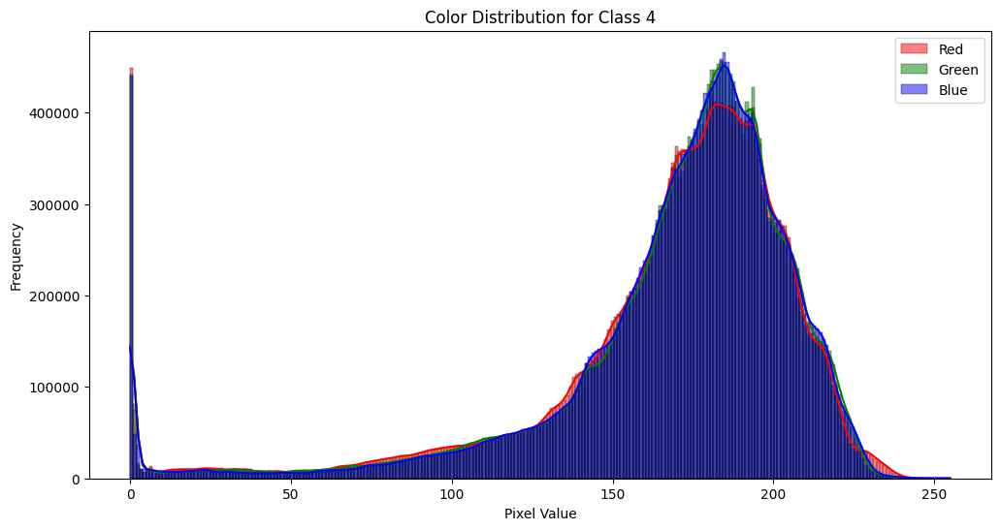

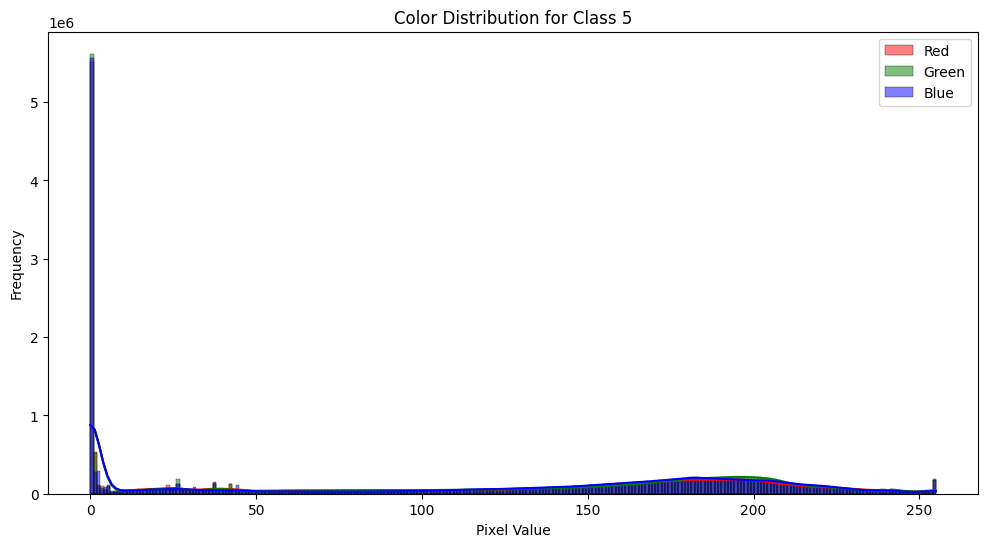

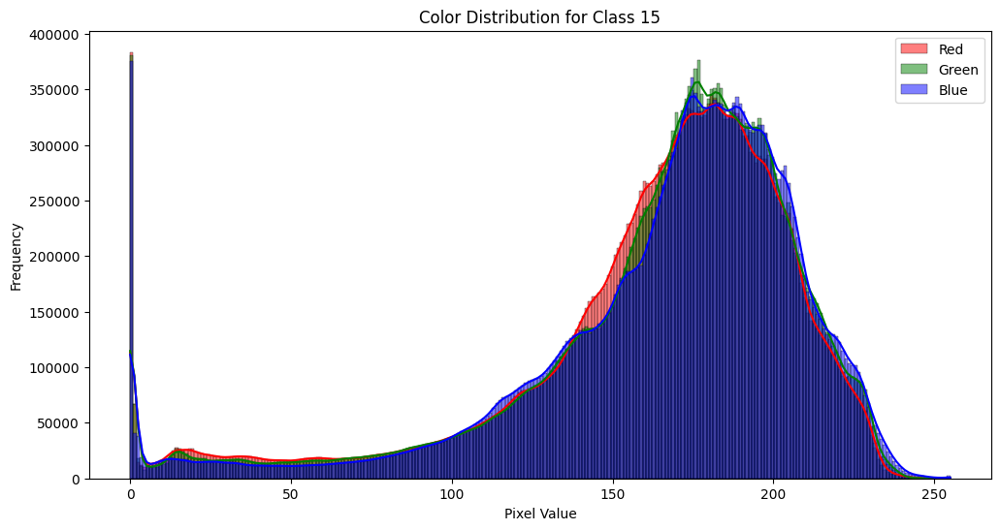

...

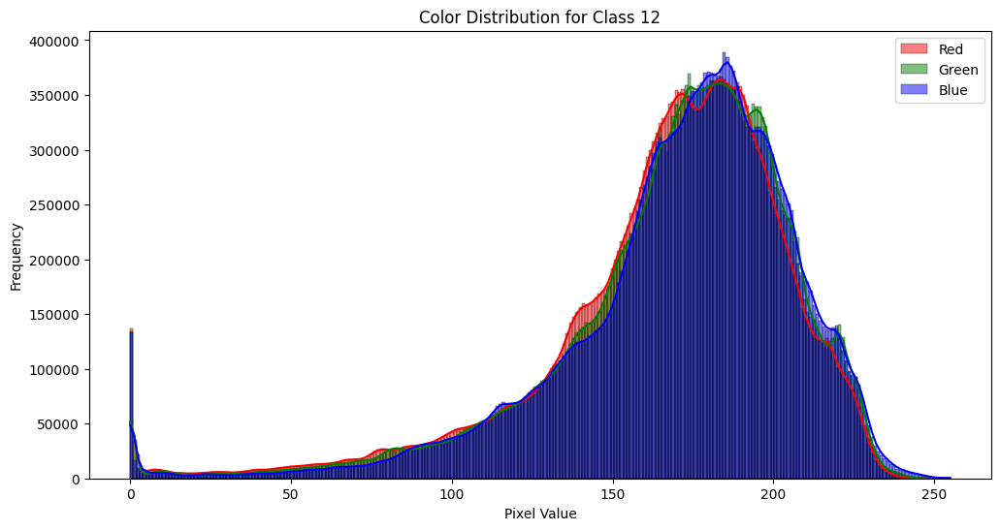

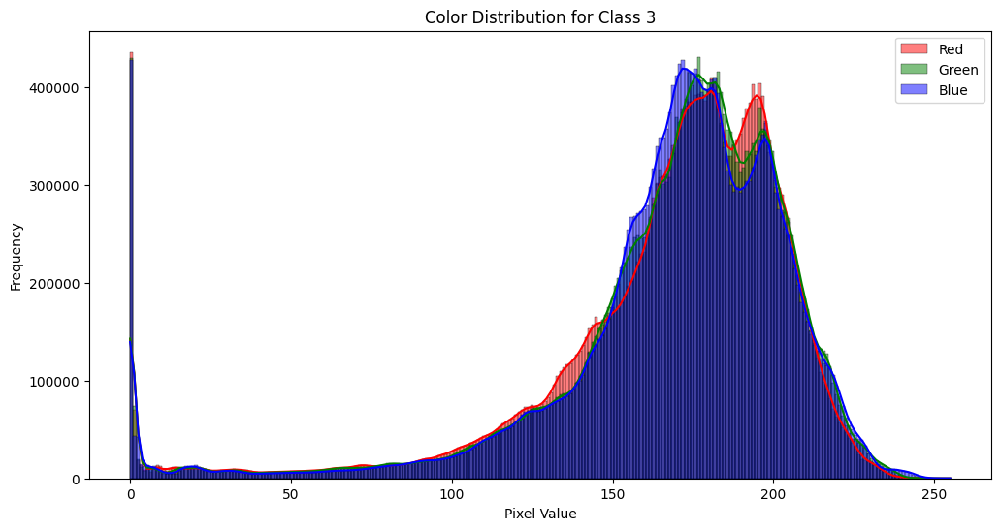

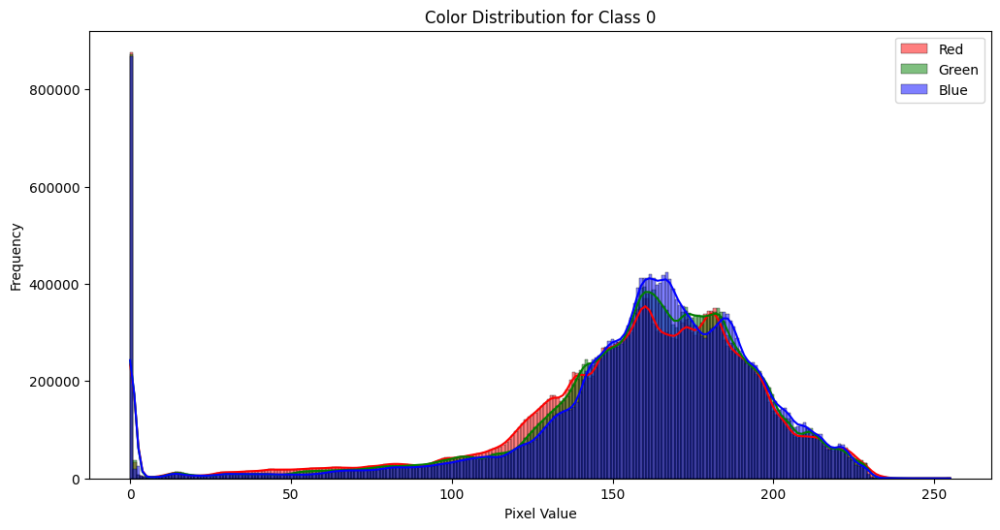

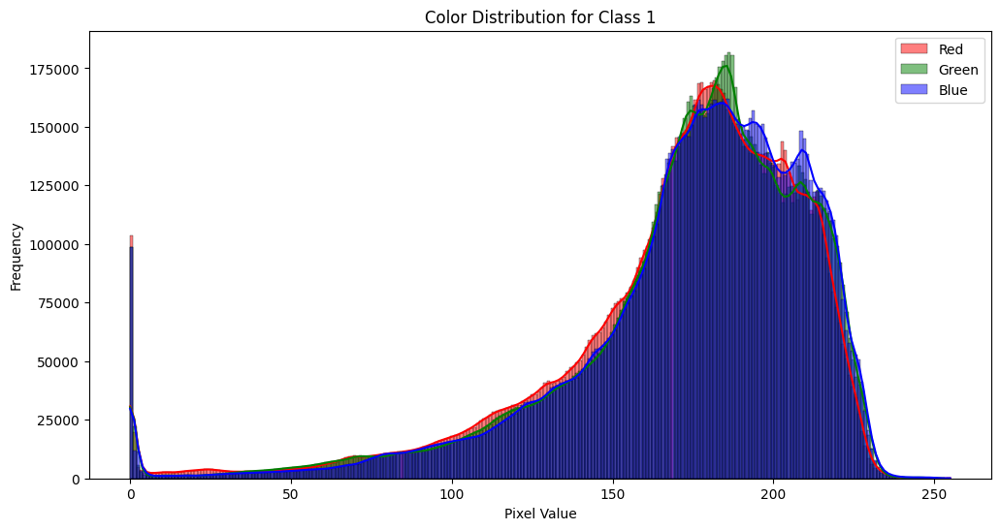

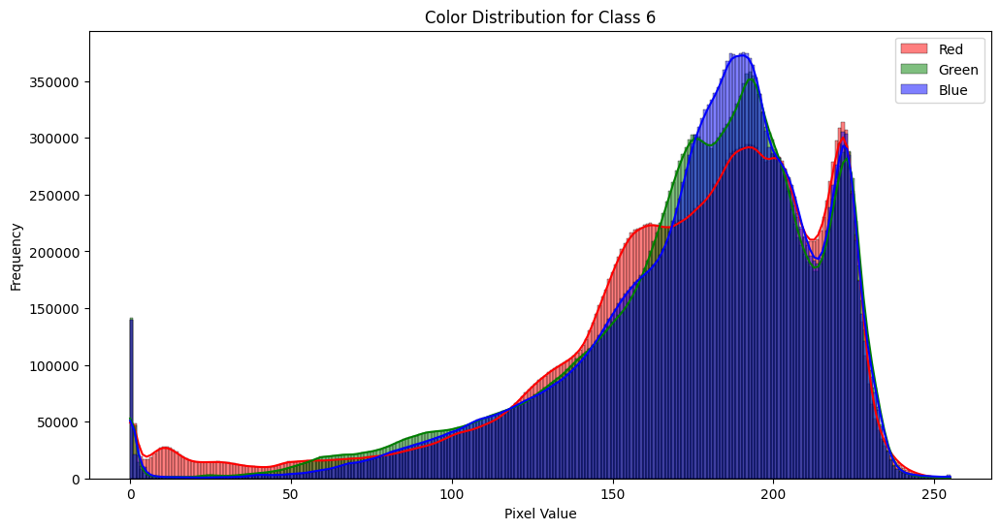

In [125]:
# Color distribution for each class
for target in df['target'].unique():
    rgb_values = []
    for image_id in df[df['target'] == target]['ID']:
        image_path = os.path.join(image_path_prefix, image_id)
        image = np.array(Image.open(image_path))
        rgb_values.append(image.reshape(-1, 3))
    
    rgb_values = np.vstack(rgb_values)
    plt.figure(figsize=(12, 6))
    sns.histplot(rgb_values[:, 0], bins=256, color='red', alpha=0.5, label='Red', kde=True)
    sns.histplot(rgb_values[:, 1], bins=256, color='green', alpha=0.5, label='Green', kde=True)
    sns.histplot(rgb_values[:, 2], bins=256, color='blue', alpha=0.5, label='Blue', kde=True)
    plt.title(f'Color Distribution for Class {target}')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

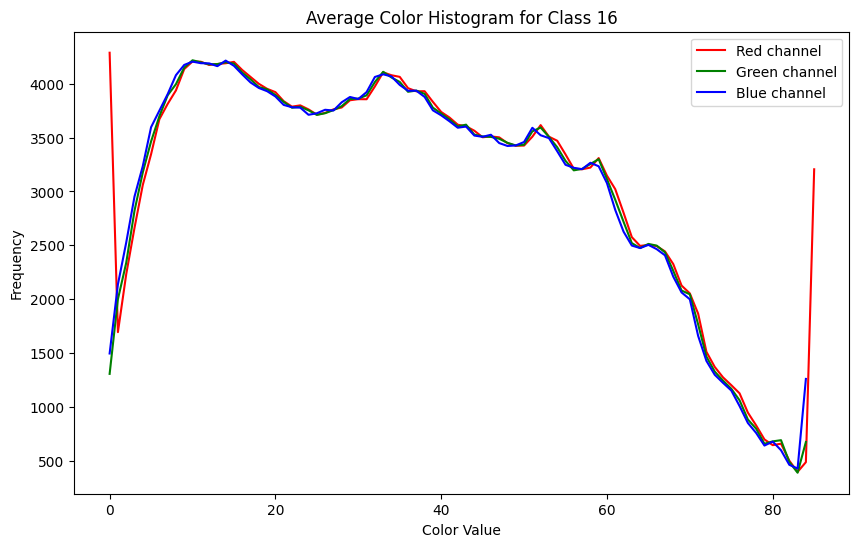

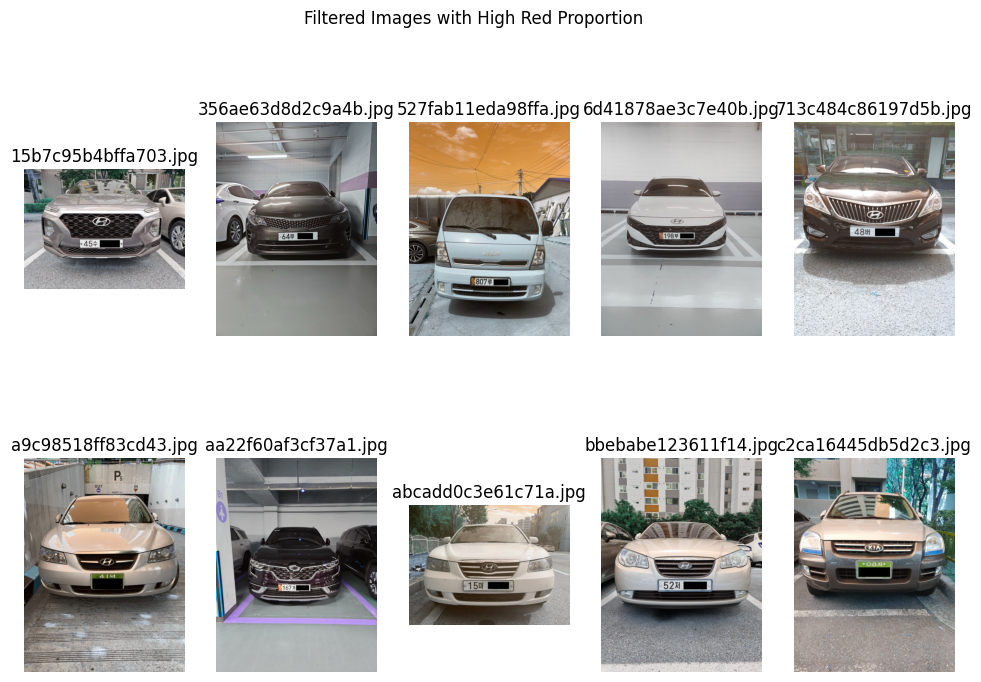

In [163]:
# Assuming df is your DataFrame and image_path_prefix is defined
class_number = 16

# Step 1: Extract images of class 16
class_images = df[df['target'] == class_number]

# Initialize a list to store histograms
histograms = []

# Step 2: Calculate color histograms for each image
for index, row in class_images.iterrows():
    image_path = os.path.join(image_path_prefix, row['ID'])
    image = Image.open(image_path)
    
    # Convert image to RGB if not already in that format
    if image.mode != 'RGB':
        image = image.convert('RGB')
    
    # Get histogram data
    histogram, _ = np.histogram(np.array(image).flatten(), bins=256, range=(0, 256))
    histograms.append(histogram)

# Convert the list of histograms to a numpy array for easier manipulation
histograms = np.array(histograms)

# Step 3: Visualize the color histogram
# Average histogram across all images in class 16
average_histogram = histograms.mean(axis=0)

# Plotting the histogram for each color channel
colors = ('red', 'green', 'blue')
plt.figure(figsize=(10, 6))
for i, color in enumerate(colors):
    plt.plot(average_histogram[i::3], color=color, label=f'{color.capitalize()} channel')

plt.title('Average Color Histogram for Class 16')
plt.xlabel('Color Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Step 4: Apply Color-Based Filtering
# Example: Filter images that have a high proportion of red
threshold = 0.5  # Adjust this threshold as needed
filtered_images = []
filtered_image_names = []

for index, row in class_images.iterrows():
    image_path = os.path.join(image_path_prefix, row['ID'])
    image = Image.open(image_path).convert('RGB')
    red_channel = np.array(image)[:, :, 0]
    
    # Calculate the proportion of red pixels
    red_proportion = np.sum(red_channel > 128) / red_channel.size
    
    if red_proportion > threshold:
        filtered_images.append(image)
        filtered_image_names.append(row['ID'])  # Store the image name

# Visualize filtered images with their names
plt.figure(figsize=(12, 8))
num_filtered_images = min(len(filtered_images), 10)  # Display up to 10 filtered images
for i in range(num_filtered_images):
    plt.subplot(2, 5, i + 1)
    plt.imshow(filtered_images[i])
    plt.title(filtered_image_names[i])  # Display the image name
    plt.axis('off')
plt.suptitle('Filtered Images with High Red Proportion')
plt.show()

                Image ID   Contrast
0   03ce6a0a86939c04.jpg  55.612155
1   0636f0cd41b60ffe.jpg  44.871276
2   1103b95d240a31bd.jpg  42.470780
3   13c183761855c4e6.jpg  53.269315
4   18964b9de31b1356.jpg  55.198523
..                   ...        ...
95  f185764e6c371e7b.jpg  55.663319
96  f22ee2bc97dfaacb.jpg  46.008889
97  f4775a882a619874.jpg  40.258834
98  fb366e8a1290169b.jpg  41.040569
99  fd344db80a9a9708.jpg  42.472549

[100 rows x 2 columns]


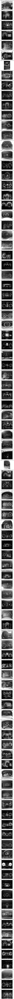

In [179]:
# Assuming df is your DataFrame containing image paths and labels
class_number = 2

# Step 1: Extract images of class 2
class_images = df[df['target'] == class_number]

# Initialize a list to store contrast values
contrast_values = []
image_ids = []
images = []  # List to store images

# Step 2: Calculate contrast for each image and store images
for index, row in class_images.iterrows():
    image_path = os.path.join(image_path_prefix, row['ID'])
    image = Image.open(image_path).convert('L')  # Convert to grayscale
    
    # Convert image to numpy array and calculate standard deviation (contrast)
    image_array = np.array(image)
    contrast = np.std(image_array)  # Standard deviation as a measure of contrast
    contrast_values.append(contrast)
    image_ids.append(row['ID'])  # Store the image ID
    images.append(image)  # Store the original image

# Step 3: Store contrast values in a DataFrame
contrast_df = pd.DataFrame({
    'Image ID': image_ids,
    'Contrast': contrast_values
})

# Display the contrast values
print(contrast_df)

# Step 4: Show images with their contrast values
num_images = len(images)
plt.figure(figsize=(15, num_images * 3))

for i, img in enumerate(images):
    plt.subplot(num_images, 1, i + 1)  # Create a subplot for each image
    plt.imshow(img, cmap='gray')  # Show the grayscale image
    plt.title(f'Image ID: {image_ids[i]}, Contrast: {contrast_values[i]:.2f}')  # Title with contrast
    plt.axis('off')  # Hide axes

plt.tight_layout()  # Adjust layout
plt.show()

In [3]:
# Assuming df is your DataFrame containing the images and their targets
classes_to_filter = [5, 8, 9]
class_images = df[df['target'].isin(classes_to_filter)]

train_image_directory = '/root/CV_PJT/CV_PJT/data/data/train'  # 훈련 이미지 폴더

# Construct image paths for training data
df['image_path'] = df['ID'].apply(lambda x: os.path.join(train_image_directory, f"{x}" if not x.endswith('.jpg') else x))

# Function to process and highlight edges in an image
def process_image(image_path):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian Blur
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

    # Use Canny edge detection
    edges = cv2.Canny(blurred_image, threshold1=30, threshold2=100)

    # Create a colored version of edges for highlighting
    colored_edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

    # Highlight edges on the original image
    highlighted_edges = cv2.addWeighted(image, 0.8, colored_edges, 0.2, 0)

    return highlighted_edges

# Iterate through the filtered DataFrame and process each image
for index, row in class_images.iterrows():
    image_path = row['image_path']  # Adjust the column name as per your DataFrame
    highlighted_image = process_image(image_path)
    
    # Display the highlighted edges
    plt.imshow(cv2.cvtColor(highlighted_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Highlighted Edges for Class {row["target"]}')  # Display class number
    plt.axis('off')
    plt.show()


NameError: name 'df' is not defined

### 5) 해상도

In [156]:
# Check image resolutions
image_resolutions = df['ID'].apply(lambda x: Image.open(os.path.join(image_path_prefix, x)).size)
df['resolution'] = image_resolutions
print(df['resolution'].value_counts())

resolution
(443, 591)    1004
(591, 443)     282
(682, 384)      18
(608, 430)      10
(643, 407)       8
              ... 
(512, 511)       1
(597, 438)       1
(582, 449)       1
(636, 412)       1
(722, 362)       1
Name: count, Length: 125, dtype: int64
